# CRW Baby Coral

In [48]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import xarray as xr

In [4]:
# Open CRW climatology
CRW_netCDF = '/home/pyk2106/data9/GR6901/work/pyk2106/BabyCoral/CRW/ct5km_climatology_v3.1.nc'
CRW_clim = xr.open_mfdataset(CRW_netCDF)

In [5]:
CRW_clim

<xarray.Dataset>
Dimensions:                      (time: 1, lat: 3600, lon: 7200)
Coordinates:
  * time                         (time) datetime64[ns] 2012-12-31T12:00:00
  * lat                          (lat) float32 89.97 89.93 ... -89.92 -89.97
  * lon                          (lon) float32 -180.0 -179.9 ... 179.9 180.0
Data variables: (12/27)
    sst_clim_mmm                 (time, lat, lon) float32 dask.array<chunksize=(1, 900, 1800), meta=np.ndarray>
    sst_clim_january             (time, lat, lon) float32 dask.array<chunksize=(1, 900, 1800), meta=np.ndarray>
    sst_clim_february            (time, lat, lon) float32 dask.array<chunksize=(1, 900, 1800), meta=np.ndarray>
    sst_clim_march               (time, lat, lon) float32 dask.array<chunksize=(1, 900, 1800), meta=np.ndarray>
    sst_clim_april               (time, lat, lon) float32 dask.array<chunksize=(1, 900, 1800), meta=np.ndarray>
    sst_clim_may                 (time, lat, lon) float32 dask.array<chunksize=(1, 900, 1800), meta=np.ndarray>
    ...                           ...
    mask_for_sst_clim_august     (time, lat, lon) int8 dask.array<chunksize=(1, 1200, 2400), meta=np.ndarray>
    mask_for_sst_clim_september  (time, lat, lon) int8 dask.array<chunksize=(1, 1200, 2400), meta=np.ndarray>
    mask_for_sst_clim_october    (time, lat, lon) int8 dask.array<chunksize=(1, 1200, 2400), meta=np.ndarray>
    mask_for_sst_clim_november   (time, lat, lon) int8 dask.array<chunksize=(1, 1200, 2400), meta=np.ndarray>
    mask_for_sst_clim_december   (time, lat, lon) int8 dask.array<chunksize=(1, 1200, 2400), meta=np.ndarray>
    crs                          int16 ...
Attributes: (12/58)
    Conventions:                CF-1.6, ACDD-1.3
    ncei_template_version:      NCEI_NetCDF_Grid_Template_v2.0
    title:                      NOAA Coral Reef Watch Global 5km Satellite Se...
    summary:                    This is the climatology used for deriving NOA...
    references:                 https://coralreefwatch.noaa.gov/satellite/ind...
    institution:                NOAA/NESDIS/STAR Coral Reef Watch program
    ...                         ...
    publisher_url:              http://coralreefwatch.noaa.gov
    publisher_email:            coralreefwatch@noaa.gov
    contributor_name:           NOAA Coral Reef Watch program
    contributor_role:           Collecting source data and deriving products;...
    processing_level:           Derived from L4 satellite sea surface tempera...
    cdm_data_type:              Grid

In [32]:
# Verify the File Path:
# Ensure that the file path is correct and that the file exists at the specified location.

import os

file_path = '/home/pyk2106/data9/GR6901/work/pyk2106/BabyCoral/CRW/ct5km_sst-mean_v3.1_201001.nc'
print(os.path.exists(file_path))  # Should return True if the file exists


True


In [ ]:
# Read the File Using a Different Library:
# Try using the netCDF4 library directly to see if the file can be opened without issues.

import netCDF4

try:
    dataset = netCDF4.Dataset(file_path, mode='r')
    print(dataset)
except OSError as e:
    print(f"Error opening file: {e}")


In [ ]:
# Update Libraries:
#Ensure that your xarray and netCDF4 libraries are up to date.

pip install --upgrade xarray netCDF4


In [35]:
# Check File Permissions:
# Ensure that you have the necessary read permissions for the file.

import os

print(os.access(file_path, os.R_OK))  # Should return True if you have read permissions


True


In [ ]:
# Open monthly mean sst CRW netCDF files

import xarray as xr

CRW_sst_netCDF = '/home/pyk2106/data9/GR6901/work/pyk2106/BabyCoral/CRW/ct5km_sst-mean_v3.1_201002.nc'
CRW_201002 = xr.open_dataset(CRW_sst_netCDF)
CRW_201002

In [ ]:
# Check to see if this one problematic file will open on its own

import xarray as xr

file_path1 = '/home/pyk2106/data9/GR6901/work/pyk2106/BabyCoral/CRW/ct5km_sst-mean_v3.1_201002.nc'

try:
    ds = xr.open_dataset(file_path1)
    print(ds)
except OSError as e:
    print(f"Error opening the file: {e}")


In [ ]:
# Read with h5py: Try to open the file using h5py to see if the issue is related to the NetCDF library.

import h5py

file_path = '/home/pyk2106/data9/GR6901/work/pyk2106/BabyCoral/CRW/ct5km_sst-mean_v3.1_201002.nc'

try:
    with h5py.File(file_path, 'r') as f:
        print(f.keys())
except Exception as e:
    print(f"Error reading the file with h5py: {e}")



In [40]:
# Check which files have an error opening so that I can redownload those from CRW website

# Directory containing the NetCDF files
directory = '/home/pyk2106/data9/GR6901/work/pyk2106/BabyCoral/CRW/'
file_pattern = 'ct5km_sst-mean_v3.1_*.nc'

# List to keep track of problematic files
problematic_files = []

# Loop through each file in the directory
for filename in os.listdir(directory):
    if filename.endswith('.nc') and file_pattern.split('*')[0] in filename:
        file_path = os.path.join(directory, filename)
        try:
            # Try to open the NetCDF file
            xr.open_dataset(file_path)
        except Exception as e:
            # If an error occurs, log the file name and the error
            print(f"Error with file {filename}: {e}")
            problematic_files.append(file_path)

# Output problematic files
if problematic_files:
    print("The following files encountered errors:")
    for pf in problematic_files:
        print(pf)
else:
    print("All files opened successfully.")

All files opened successfully.


In [49]:
# Open all monthly sst netcdf files into 1 and slice for baby coral location

# Define the path to your NetCDF files
file_path = '/home/pyk2106/data9/GR6901/work/pyk2106/BabyCoral/CRW/ct5km_sst-mean_v3.1_*.nc'

# Open the dataset, keeping only the necessary variables
CRW_sst = xr.open_mfdataset(
    file_path,
    concat_dim='time',
    combine='nested',
    data_vars='minimal',
    coords='minimal',
    compat='override',
    drop_variables=['mask', 'crs']  # Replace with actual variable names to drop
)

# Keep only sea surface temperature, latitude, longitude, and time
CRW_sst = CRW_sst[['sea_surface_temperature', 'lat', 'lon', 'time']]  # Replace 'sea_surface_temperature' with the actual variable name if different

# Define the target latitude and longitude
target_lat = 26.144225
target_lon = -80.09816

# Slice the data to get the specific location
CRW_babycoral = CRW_sst.sel(lat=target_lat, lon=target_lon, method='nearest')

# Display the sliced data
CRW_babycoral

<xarray.Dataset>
Dimensions:                  (time: 272)
Coordinates:
    lat                      float32 26.12
    lon                      float32 -80.07
  * time                     (time) datetime64[ns] 2001-01-31T12:00:00 ... 20...
Data variables:
    sea_surface_temperature  (time) float32 dask.array<chunksize=(1,), meta=np.ndarray>
Attributes: (12/58)
    acknowledgement:            NOAA Coral Reef Watch Program
    cdm_data_type:              Grid
    comment:                    This is a product of the NOAA Coral Reef Watc...
    contributor_name:           NOAA Coral Reef Watch Program
    contributor_role:           Collecting source data and deriving products;...
    Conventions:                CF-1.6, ACDD-1.3
    ...                         ...
    time_coverage_duration:     P1M
    time_coverage_end:          20010201T000000Z
    time_coverage_resolution:   P1M
    time_coverage_start:        20010101T000000Z
    title:                      NOAA Coral Reef Watch Global 5km Satellite Se...
    uuid:                       3f164b3e-222c-48f9-b2fc-79cfe38e1d57

HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 11:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not

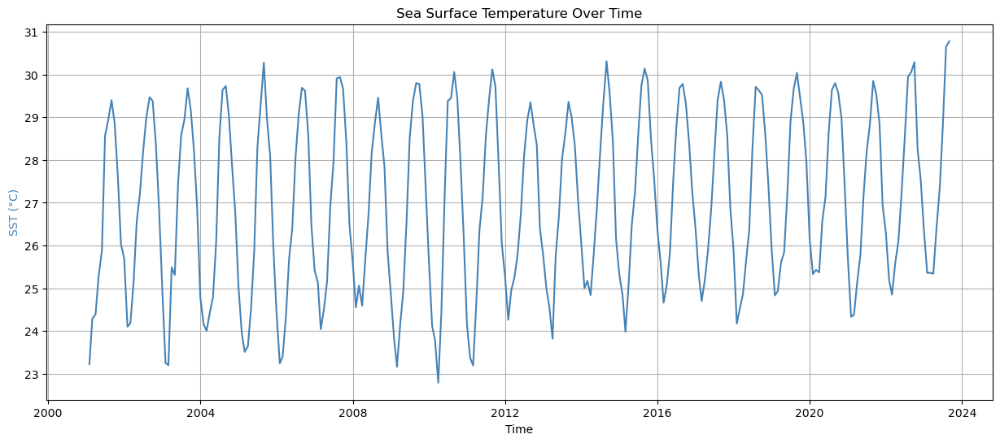

In [50]:


# Create a new figure and axis sharing the same x-axis
fig, ax1 = plt.subplots(figsize=(15, 6))

# Select the specific DataArray for sea surface temperature
sst_data = CRW_babycoral['sea_surface_temperature']  # Adjust the variable name if different

# Plot SST on the primary y-axis
ax1.plot(sst_data.time, sst_data.values, color='steelblue')  # Use .values to get a NumPy array
ax1.set_xlabel('Time')
ax1.set_ylabel('SST (°C)', color='steelblue')
ax1.set_title('Sea Surface Temperature Over Time')

# Optional: Add grid and legend
ax1.grid()
plt.show()


In [46]:
import xarray as xr
import pandas as pd

# Assuming you have the SST DataArray named CRW_babycoral
# CRW_babycoral = xr.DataArray(...)  # Your existing DataArray

# Convert DataArray to DataFrame
df = CRW_babycoral.to_dataframe().reset_index()

# Reverse the order of the DataFrame
df_reversed = df.iloc[::-1].reset_index(drop=True)

# Add a new column with numbers from 1 onwards for the new index
df_reversed.insert(0, 'Index', range(1, len(df_reversed) + 1))

# Save to the first TXT file with index, date, and SST
df_reversed[['Index', 'time', 'sea_surface_temperature']].to_csv(
    'CRW_babycoral_sst_with_index.txt',
    index=False,
    sep='\t',
    header=['Index', 'Date', 'SST']
)

# Save to the second TXT file with only date and SST
df_reversed[['time', 'sea_surface_temperature']].to_csv(
    'CRW_babycoral_sst.txt',
    index=False,
    sep='\t',
    header=['Date', 'SST']
)

print("Files saved as 'CRW_babycoral_sst_with_index.txt' and 'CRW_babycoral_sst.txt'.")


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 17:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not

Files saved as 'CRW_babycoral_sst_with_index.txt' and 'CRW_babycoral_sst.txt'.
